In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import csv
import sklearn as skl 
import re
import plotly.express as px

In [104]:
filename = ('zillow_data.csv')
zillow = pd.read_csv(filename)
zillow 

,RegionID,SizeRank,RegionName,RegionType,StateName,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,...,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31
0,102001,0,United States,country,NaN,102789.697694,103049.939217,103601.622885,104351.865312,105161.916479,...,353640.634872,356262.355375,357085.870800,356748.578567,355613.153027,354235.494756,352081.874078,350636.799503,351690.121318,355696.229487
1,394913,1,"New York, NY",msa,NY,179596.380743,178856.580865,178684.932576,178910.659409,179777.907182,...,628172.695628,634305.247586,637038.141571,638235.028235,639271.893464,639241.206992,640361.830756,640944.434908,644510.788421,652100.187384
2,753899,2,"Los Angeles, CA",msa,CA,188228.766606,189391.933782,190272.257732,190645.410038,191297.662169,...,919426.533170,929936.596980,934882.553268,938091.463052,938967.819386,938254.947161,934470.568092,933826.222466,940735.867608,959411.775343
3,394463,3,"Chicago, IL",msa,IL,131019.144914,130419.940343,131850.332535,133549.662356,135127.044169,...,310026.007292,313894.273983,315501.489267,315410.589104,314775.197265,313176.519853,310949.043289,309748.832259,311209.933213,315995.373812
4,394514,4,"Dallas, TX",msa,TX,110372.477528,111053.984565,112113.173095,112967.688376,113478.507429,...,382932.772867,383939.188533,383199.276441,380993.803323,378333.120312,376025.635219,373315.372483,372514.011718,374497.205170,378460.756365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890,753929,935,"Zapata, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,125821.257591,127663.387675,127210.162257,125380.594235,122231.845110,118495.811851,115758.607696,112106.279341,111694.242641,114378.564501
891,394743,936,"Ketchikan, AK",msa,AK,NaN,NaN,NaN,NaN,NaN,...,399748.763652,402617.809917,400036.165874,394390.752707,387229.751279,384733.818580,378347.271194,378231.120329,378924.356279,381718.718046
892,753874,937,"Craig, CO",msa,CO,67939.666569,68287.852387,69087.433951,69321.217969,70470.343646,...,281140.320620,284448.197610,285114.275990,285994.410948,286361.975721,283928.506371,280350.547608,277441.285953,277484.859647,278787.023657
893,395188,938,"Vernon, TX",msa,TX,NaN,NaN,NaN,NaN,NaN,...,99354.530238,99047.488658,97709.840251,95700.639004,94191.157814,90993.517394,89440.579535,90063.072944,89464.852820,90856.415640


In [105]:
# I dropped all columns that had null values and then used the loc function to only keep the top 500 cities
#Dropped RegionType because it served no purpose
zillowna = zillow.dropna()
Z = zillowna.loc[zillowna['SizeRank'] <= 500].reset_index(drop = True)
Z = Z.drop('RegionType', axis = 1)
Z

,RegionID,SizeRank,RegionName,StateName,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,...,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31
0,394913,1,"New York, NY",NY,179596.380743,178856.580865,178684.932576,178910.659409,179777.907182,180741.747509,...,628172.695628,634305.247586,637038.141571,638235.028235,639271.893464,639241.206992,640361.830756,640944.434908,644510.788421,652100.187384
1,394463,3,"Chicago, IL",IL,131019.144914,130419.940343,131850.332535,133549.662356,135127.044169,136476.600672,...,310026.007292,313894.273983,315501.489267,315410.589104,314775.197265,313176.519853,310949.043289,309748.832259,311209.933213,315995.373812
2,394514,4,"Dallas, TX",TX,110372.477528,111053.984565,112113.173095,112967.688376,113478.507429,113992.190296,...,382932.772867,383939.188533,383199.276441,380993.803323,378333.120312,376025.635219,373315.372483,372514.011718,374497.205170,378460.756365
3,394692,5,"Houston, TX",TX,108096.111106,108369.733859,109054.647276,109503.311588,109651.616908,109783.656971,...,310840.578811,311729.361306,311779.544985,310572.165183,308551.126061,306847.555056,305050.742386,304734.678991,305771.967907,308538.775426
4,395209,6,"Washington, DC",VA,169372.858719,169612.185879,169638.538413,170403.350279,171160.954984,171563.337348,...,557375.035674,560053.263682,559791.706139,557746.158467,555823.243377,554066.961178,552537.095852,551427.459148,555904.084742,564691.279693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,394647,486,"Greeneville, TN",TN,59960.834697,60185.536412,60734.976332,61551.200126,61940.688527,63340.955343,...,220515.817455,224831.170056,228888.735312,230416.680254,229635.296279,230029.964419,227186.778662,223579.069680,225234.149599,231125.704014
240,394655,488,"Greenwood, SC",SC,40783.584800,40990.185505,41132.104349,42035.942578,42608.873156,43441.052776,...,160770.035337,161675.702428,161585.220933,160949.444525,158979.091488,159096.680563,157891.051842,155350.617120,156330.975422,158965.107434
241,394752,490,"Klamath Falls, OR",OR,69510.623520,70163.335606,71343.979460,73019.906559,73828.489569,74326.599729,...,287000.708360,289532.789873,292211.352237,292481.454624,291683.489010,290189.506897,287805.457614,284727.081626,284059.682986,286802.043940
242,394877,491,"Morehead City, NC",NC,122391.555226,123198.011563,122256.221599,121119.592061,123934.494869,124885.485160,...,449957.023264,452702.663256,453756.657020,453378.114497,452645.509268,453309.777608,451813.443755,448207.738169,447761.882316,451600.817077


In [106]:
#Sliced the columns to apply the slicing technique and to trim our data down from years 2016 to now
#Retained our 4 non data coulmns
Z.columns
zfirst = Z.iloc[:, :4] .reset_index()
zlast = Z.iloc[:, -99:].reset_index()

In [107]:
#Merge both dataframe togethers
Z_trim = pd.merge(zfirst, zlast, on = 'index', how = 'outer')

In [108]:
# Dropped the index column and sorted values by sizerank just for order purposes
Z_trim = Z_trim.drop(['index'], axis = 1).sort_values('SizeRank')


In [109]:
#Just creating different ways thart we could potentially use to visualize the data
#might not be needed at all
ZGroup = Z_trim.groupby(['RegionName']).sum().sort_values('SizeRank')
ZGroup

,RegionID,SizeRank,StateName,2016-01-31,2016-02-29,2016-03-31,2016-04-30,2016-05-31,2016-06-30,2016-07-31,...,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31
RegionName,,,,,,,,,,,,,,,,,,,,,
"New York, NY",394913,1,NY,430685.716670,429616.858855,428408.069101,430313.722092,433988.423810,438568.772920,441894.930227,...,628172.695628,634305.247586,637038.141571,638235.028235,639271.893464,639241.206992,640361.830756,640944.434908,644510.788421,652100.187384
"Chicago, IL",394463,3,IL,206309.152745,205293.147954,205208.562419,208122.190686,211730.774275,214702.199188,216966.849632,...,310026.007292,313894.273983,315501.489267,315410.589104,314775.197265,313176.519853,310949.043289,309748.832259,311209.933213,315995.373812
"Dallas, TX",394514,4,TX,197509.359745,199269.351899,201279.502080,205176.020071,208653.445629,211313.317832,213573.401898,...,382932.772867,383939.188533,383199.276441,380993.803323,378333.120312,376025.635219,373315.372483,372514.011718,374497.205170,378460.756365
"Houston, TX",394692,5,TX,193108.213329,193916.137688,194296.736466,196375.473456,198406.218107,199437.524500,200325.596668,...,310840.578811,311729.361306,311779.544985,310572.165183,308551.126061,306847.555056,305050.742386,304734.678991,305771.967907,308538.775426
"Washington, DC",395209,6,VA,386177.604787,385532.756444,385683.008213,387959.049463,391404.328072,394478.328208,396186.020133,...,557375.035674,560053.263682,559791.706139,557746.158467,555823.243377,554066.961178,552537.095852,551427.459148,555904.084742,564691.279693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Greeneville, TN",394647,486,TN,116209.519066,114633.861956,114955.143452,116590.498006,117704.598318,118680.523290,119814.260406,...,220515.817455,224831.170056,228888.735312,230416.680254,229635.296279,230029.964419,227186.778662,223579.069680,225234.149599,231125.704014
"Greenwood, SC",394655,488,SC,94150.882565,93299.168051,92428.743056,92587.881448,93635.333592,94923.037983,95025.322783,...,160770.035337,161675.702428,161585.220933,160949.444525,158979.091488,159096.680563,157891.051842,155350.617120,156330.975422,158965.107434
"Klamath Falls, OR",394752,490,OR,145571.626226,145994.101600,146320.659887,147226.202714,148821.410819,150298.701972,151333.375821,...,287000.708360,289532.789873,292211.352237,292481.454624,291683.489010,290189.506897,287805.457614,284727.081626,284059.682986,286802.043940


In [110]:
#trim dataframe to a categorical dataframe and a year data frame
#Tested the filter fucntion to see if we could sort off of 2016 and using this to get yearly prices averages
Zt = Z_trim.iloc[:, 5:]
Zcat = Z_trim.iloc[:,:5]
Zt.filter(like = str('2016'))

,2016-02-29,2016-03-31,2016-04-30,2016-05-31,2016-06-30,2016-07-31,2016-08-31,2016-09-30,2016-10-31,2016-11-30,2016-12-31
0,429616.858855,428408.069101,430313.722092,433988.423810,438568.772920,441894.930227,443566.618039,444736.022511,445306.457221,445800.596599,447741.897182
1,205293.147954,205208.562419,208122.190686,211730.774275,214702.199188,216966.849632,218310.341811,218484.223115,218585.170118,218079.958719,217382.554565
2,199269.351899,201279.502080,205176.020071,208653.445629,211313.317832,213573.401898,215123.796542,216262.538446,216967.610770,217926.040991,218453.898996
3,193916.137688,194296.736466,196375.473456,198406.218107,199437.524500,200325.596668,200808.259028,201092.905010,200971.629913,200937.356730,200731.114458
4,385532.756444,385683.008213,387959.049463,391404.328072,394478.328208,396186.020133,396108.142380,395578.498655,395852.295920,396264.547860,396623.167682
...,...,...,...,...,...,...,...,...,...,...,...
239,114633.861956,114955.143452,116590.498006,117704.598318,118680.523290,119814.260406,121338.472238,122337.868955,123378.987560,124144.871613,124526.046087
240,93299.168051,92428.743056,92587.881448,93635.333592,94923.037983,95025.322783,95009.510488,95237.641500,95417.707388,95517.319521,95191.447614
241,145994.101600,146320.659887,147226.202714,148821.410819,150298.701972,151333.375821,152553.943044,153227.700004,153245.906383,152537.971769,151939.018162
242,243305.411371,244000.914139,245362.829203,248078.665039,251133.271009,251785.621419,252343.418922,253692.723368,254465.511962,254883.003777,253008.188058


In [111]:
#Created a dataframe to hold the values returned from the loop function

avg_zil_df = pd.DataFrame()

for year in range(2016, 2025):
    year_columns = Zt.filter(like=str(year))
    
    # Calculate the average prices for each city for the current year
    avg_zil_df[f'{year}_avg_price'] = year_columns.mean(axis=1)


avg_zil_df = avg_zil_df.round(2)
avg_zil_df

,2016_avg_price,2017_avg_price,2018_avg_price,2019_avg_price,2020_avg_price,2021_avg_price,2022_avg_price,2023_avg_price,2024_avg_price
0,439085.67,461688.39,483569.63,498775.22,517784.50,567885.07,611672.79,625467.05,645851.80
1,213896.91,224840.78,234967.13,240221.62,248190.70,274716.60,296950.10,305829.20,312318.05
2,211272.63,231902.54,249487.47,257531.87,270318.49,316072.57,380095.01,377179.93,375157.32
3,198845.36,205787.40,214224.14,222586.03,232091.03,264181.44,307233.39,307236.05,306348.47
4,392879.10,406612.23,420030.91,433279.20,458047.84,508329.64,543047.40,549481.55,557340.94
...,...,...,...,...,...,...,...,...,...
239,119827.74,125327.22,131031.10,143451.47,154228.01,185000.97,209337.96,220085.88,226646.31
240,94388.46,94395.26,99452.13,107285.55,117408.96,134632.04,151321.35,157926.69,156882.23
241,150318.09,157731.30,173142.03,184509.04,201906.33,245764.17,278948.95,284620.47,285196.27
242,250187.23,257936.93,268213.78,278624.83,296663.18,355982.74,421763.46,444202.22,449190.15


In [112]:
#Used the concat function to add the columns back together and have a final column ready for manipulation
avg_zil_price = pd.concat([Zcat,avg_zil_df], axis = 1).drop(['index'], axis = 1, errors = 'ignore')
avg_zil_price

,RegionID,SizeRank,RegionName,StateName,2016-01-31,2016_avg_price,2017_avg_price,2018_avg_price,2019_avg_price,2020_avg_price,2021_avg_price,2022_avg_price,2023_avg_price,2024_avg_price
0,394913,1,"New York, NY",NY,430685.716670,439085.67,461688.39,483569.63,498775.22,517784.50,567885.07,611672.79,625467.05,645851.80
1,394463,3,"Chicago, IL",IL,206309.152745,213896.91,224840.78,234967.13,240221.62,248190.70,274716.60,296950.10,305829.20,312318.05
2,394514,4,"Dallas, TX",TX,197509.359745,211272.63,231902.54,249487.47,257531.87,270318.49,316072.57,380095.01,377179.93,375157.32
3,394692,5,"Houston, TX",TX,193108.213329,198845.36,205787.40,214224.14,222586.03,232091.03,264181.44,307233.39,307236.05,306348.47
4,395209,6,"Washington, DC",VA,386177.604787,392879.10,406612.23,420030.91,433279.20,458047.84,508329.64,543047.40,549481.55,557340.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,394647,486,"Greeneville, TN",TN,116209.519066,119827.74,125327.22,131031.10,143451.47,154228.01,185000.97,209337.96,220085.88,226646.31
240,394655,488,"Greenwood, SC",SC,94150.882565,94388.46,94395.26,99452.13,107285.55,117408.96,134632.04,151321.35,157926.69,156882.23
241,394752,490,"Klamath Falls, OR",OR,145571.626226,150318.09,157731.30,173142.03,184509.04,201906.33,245764.17,278948.95,284620.47,285196.27
242,394877,491,"Morehead City, NC",NC,243704.723931,250187.23,257936.93,268213.78,278624.83,296663.18,355982.74,421763.46,444202.22,449190.15


In [113]:
# Created a Dataframe with the top cities in the US to do visuals with there prices
Top_avg_zil_price = avg_zil_price.loc[avg_zil_price['SizeRank'] <= 20].reset_index(drop = True)
Top_avg_zil_price

,RegionID,SizeRank,RegionName,StateName,2016-01-31,2016_avg_price,2017_avg_price,2018_avg_price,2019_avg_price,2020_avg_price,2021_avg_price,2022_avg_price,2023_avg_price,2024_avg_price
0,394913,1,"New York, NY",NY,430685.716670,439085.67,461688.39,483569.63,498775.22,517784.50,567885.07,611672.79,625467.05,645851.80
1,394463,3,"Chicago, IL",IL,206309.152745,213896.91,224840.78,234967.13,240221.62,248190.70,274716.60,296950.10,305829.20,312318.05
2,394514,4,"Dallas, TX",TX,197509.359745,211272.63,231902.54,249487.47,257531.87,270318.49,316072.57,380095.01,377179.93,375157.32
3,394692,5,"Houston, TX",TX,193108.213329,198845.36,205787.40,214224.14,222586.03,232091.03,264181.44,307233.39,307236.05,306348.47
4,395209,6,"Washington, DC",VA,386177.604787,392879.10,406612.23,420030.91,433279.20,458047.84,508329.64,543047.40,549481.55,557340.94
5,394974,7,"Philadelphia, PA",PA,214072.758692,220226.46,229280.12,238863.56,248278.54,265779.87,299640.31,328614.99,344346.61,353628.74
6,394856,8,"Miami, FL",FL,235463.018328,248288.47,267721.54,285737.24,296528.29,312596.23,358414.35,438148.66,468396.87,484927.02
7,394347,9,"Atlanta, GA",GA,185013.385271,194085.32,209228.08,228193.85,242741.73,259822.75,308881.88,369773.67,375543.22,380483.08
8,394404,10,"Boston, MA",MA,408657.469008,426228.91,454674.74,482729.12,493299.27,522169.40,585883.61,637860.58,659235.02,679015.74
9,394976,11,"Phoenix, AZ",AZ,229319.310406,236503.23,252132.22,271523.69,288191.57,319555.56,399037.58,474327.61,450048.64,456807.36


In [114]:
#Created dataframes using groupby of the state and created the max and min dataframe for each state
#May or may not be need but just incase its done
avg_zil_price_min = avg_zil_price.groupby(['StateName']).min()
avg_zil_price_min = avg_zil_price_min.rename(columns = lambda x: x.replace('avg','min'))
avg_zil_price_max = avg_zil_price.groupby(['StateName']).max()
avg_zil_price_max = avg_zil_price_max.rename(columns = lambda x: x.replace('avg','max'))

In [115]:
#concat the two dataframe with just max and min columns for every year for each state
max_min = pd.concat([avg_zil_price_max, avg_zil_price_min], axis=1)
max_min = max_min.loc[:, ~max_min.columns.duplicated()]
max_min.columns

Index(['RegionID', 'SizeRank', 'RegionName', '2016-01-31', '2016_max_price',
       '2017_max_price', '2018_max_price', '2019_max_price', '2020_max_price',
       '2021_max_price', '2022_max_price', '2023_max_price', '2024_max_price',
       '2016_min_price', '2017_min_price', '2018_min_price', '2019_min_price',
       '2020_min_price', '2021_min_price', '2022_min_price', '2023_min_price',
       '2024_min_price'],
      dtype='object')

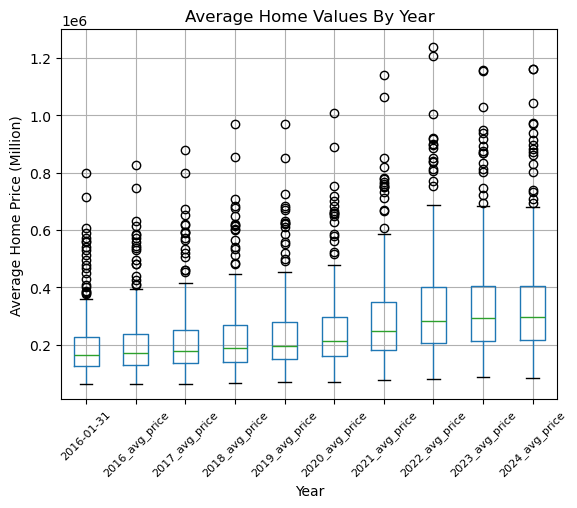

In [116]:
# Plot the box and whisker plot for average values by year
avg_zil_price_boxplot = avg_zil_price.iloc[:,4:]
avg_zil_price_boxplot.boxplot()


# Set labels and title
plt.xlabel('Year')
plt.ylabel('Average Home Price (Million)')
plt.title('Average Home Values By Year')
plt.ylim(10000,1300000)
plt.yticks()
plt.xticks(rotation=45, fontsize=8)
plt.show()


In [117]:
avg_zil_price

,RegionID,SizeRank,RegionName,StateName,2016-01-31,2016_avg_price,2017_avg_price,2018_avg_price,2019_avg_price,2020_avg_price,2021_avg_price,2022_avg_price,2023_avg_price,2024_avg_price
0,394913,1,"New York, NY",NY,430685.716670,439085.67,461688.39,483569.63,498775.22,517784.50,567885.07,611672.79,625467.05,645851.80
1,394463,3,"Chicago, IL",IL,206309.152745,213896.91,224840.78,234967.13,240221.62,248190.70,274716.60,296950.10,305829.20,312318.05
2,394514,4,"Dallas, TX",TX,197509.359745,211272.63,231902.54,249487.47,257531.87,270318.49,316072.57,380095.01,377179.93,375157.32
3,394692,5,"Houston, TX",TX,193108.213329,198845.36,205787.40,214224.14,222586.03,232091.03,264181.44,307233.39,307236.05,306348.47
4,395209,6,"Washington, DC",VA,386177.604787,392879.10,406612.23,420030.91,433279.20,458047.84,508329.64,543047.40,549481.55,557340.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,394647,486,"Greeneville, TN",TN,116209.519066,119827.74,125327.22,131031.10,143451.47,154228.01,185000.97,209337.96,220085.88,226646.31
240,394655,488,"Greenwood, SC",SC,94150.882565,94388.46,94395.26,99452.13,107285.55,117408.96,134632.04,151321.35,157926.69,156882.23
241,394752,490,"Klamath Falls, OR",OR,145571.626226,150318.09,157731.30,173142.03,184509.04,201906.33,245764.17,278948.95,284620.47,285196.27
242,394877,491,"Morehead City, NC",NC,243704.723931,250187.23,257936.93,268213.78,278624.83,296663.18,355982.74,421763.46,444202.22,449190.15


In [118]:
Top_avg_zil_price

,RegionID,SizeRank,RegionName,StateName,2016-01-31,2016_avg_price,2017_avg_price,2018_avg_price,2019_avg_price,2020_avg_price,2021_avg_price,2022_avg_price,2023_avg_price,2024_avg_price
0,394913,1,"New York, NY",NY,430685.716670,439085.67,461688.39,483569.63,498775.22,517784.50,567885.07,611672.79,625467.05,645851.80
1,394463,3,"Chicago, IL",IL,206309.152745,213896.91,224840.78,234967.13,240221.62,248190.70,274716.60,296950.10,305829.20,312318.05
2,394514,4,"Dallas, TX",TX,197509.359745,211272.63,231902.54,249487.47,257531.87,270318.49,316072.57,380095.01,377179.93,375157.32
3,394692,5,"Houston, TX",TX,193108.213329,198845.36,205787.40,214224.14,222586.03,232091.03,264181.44,307233.39,307236.05,306348.47
4,395209,6,"Washington, DC",VA,386177.604787,392879.10,406612.23,420030.91,433279.20,458047.84,508329.64,543047.40,549481.55,557340.94
5,394974,7,"Philadelphia, PA",PA,214072.758692,220226.46,229280.12,238863.56,248278.54,265779.87,299640.31,328614.99,344346.61,353628.74
6,394856,8,"Miami, FL",FL,235463.018328,248288.47,267721.54,285737.24,296528.29,312596.23,358414.35,438148.66,468396.87,484927.02
7,394347,9,"Atlanta, GA",GA,185013.385271,194085.32,209228.08,228193.85,242741.73,259822.75,308881.88,369773.67,375543.22,380483.08
8,394404,10,"Boston, MA",MA,408657.469008,426228.91,454674.74,482729.12,493299.27,522169.40,585883.61,637860.58,659235.02,679015.74
9,394976,11,"Phoenix, AZ",AZ,229319.310406,236503.23,252132.22,271523.69,288191.57,319555.56,399037.58,474327.61,450048.64,456807.36


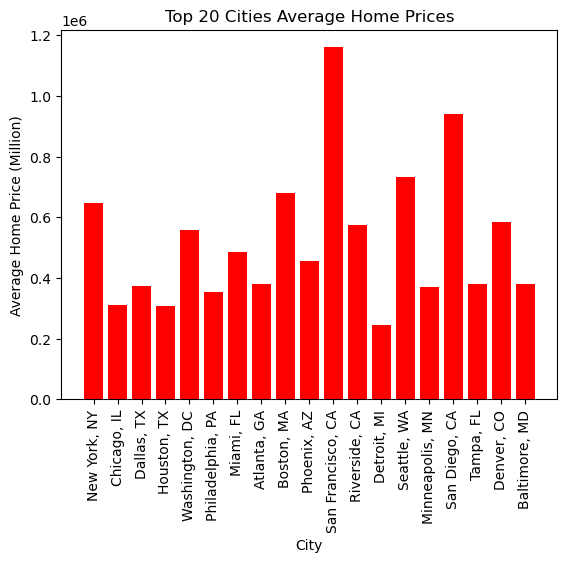

In [119]:
# Plotting the top 20 U.S. Cities
Top_avg_zil_price
#Top_avg_zil_price.plot()



x_axis = Top_avg_zil_price["RegionName"]
y_axis = Top_avg_zil_price["2024_avg_price"]
plt.xticks(rotation = "vertical")
plt.bar(x_axis, y_axis, color='r', alpha=1, align="center")
# Give our chart some labels and a tile
plt.title("Top 20 Cities Average Home Prices")
plt.xlabel("City")
plt.ylabel("Average Home Price (Million)")
plt.show()


In [120]:
Top_avg_zil_price.columns

Index(['RegionID', 'SizeRank', 'RegionName', 'StateName', '2016-01-31',
       '2016_avg_price', '2017_avg_price', '2018_avg_price', '2019_avg_price',
       '2020_avg_price', '2021_avg_price', '2022_avg_price', '2023_avg_price',
       '2024_avg_price'],
      dtype='object')

In [121]:
ZG = ZGroup.reset_index()
ZG

,RegionName,RegionID,SizeRank,StateName,2016-01-31,2016-02-29,2016-03-31,2016-04-30,2016-05-31,2016-06-30,...,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31
0,"New York, NY",394913,1,NY,430685.716670,429616.858855,428408.069101,430313.722092,433988.423810,438568.772920,...,628172.695628,634305.247586,637038.141571,638235.028235,639271.893464,639241.206992,640361.830756,640944.434908,644510.788421,652100.187384
1,"Chicago, IL",394463,3,IL,206309.152745,205293.147954,205208.562419,208122.190686,211730.774275,214702.199188,...,310026.007292,313894.273983,315501.489267,315410.589104,314775.197265,313176.519853,310949.043289,309748.832259,311209.933213,315995.373812
2,"Dallas, TX",394514,4,TX,197509.359745,199269.351899,201279.502080,205176.020071,208653.445629,211313.317832,...,382932.772867,383939.188533,383199.276441,380993.803323,378333.120312,376025.635219,373315.372483,372514.011718,374497.205170,378460.756365
3,"Houston, TX",394692,5,TX,193108.213329,193916.137688,194296.736466,196375.473456,198406.218107,199437.524500,...,310840.578811,311729.361306,311779.544985,310572.165183,308551.126061,306847.555056,305050.742386,304734.678991,305771.967907,308538.775426
4,"Washington, DC",395209,6,VA,386177.604787,385532.756444,385683.008213,387959.049463,391404.328072,394478.328208,...,557375.035674,560053.263682,559791.706139,557746.158467,555823.243377,554066.961178,552537.095852,551427.459148,555904.084742,564691.279693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,"Greeneville, TN",394647,486,TN,116209.519066,114633.861956,114955.143452,116590.498006,117704.598318,118680.523290,...,220515.817455,224831.170056,228888.735312,230416.680254,229635.296279,230029.964419,227186.778662,223579.069680,225234.149599,231125.704014
240,"Greenwood, SC",394655,488,SC,94150.882565,93299.168051,92428.743056,92587.881448,93635.333592,94923.037983,...,160770.035337,161675.702428,161585.220933,160949.444525,158979.091488,159096.680563,157891.051842,155350.617120,156330.975422,158965.107434
241,"Klamath Falls, OR",394752,490,OR,145571.626226,145994.101600,146320.659887,147226.202714,148821.410819,150298.701972,...,287000.708360,289532.789873,292211.352237,292481.454624,291683.489010,290189.506897,287805.457614,284727.081626,284059.682986,286802.043940
242,"Morehead City, NC",394877,491,NC,243704.723931,243305.411371,244000.914139,245362.829203,248078.665039,251133.271009,...,449957.023264,452702.663256,453756.657020,453378.114497,452645.509268,453309.777608,451813.443755,448207.738169,447761.882316,451600.817077


In [122]:
# Melt the DataFrame to long format
cities_melt_y = ZG.melt(id_vars=['RegionID', 'SizeRank', 'RegionName', 'StateName'], var_name='Year', value_name='Value')

# Convert the Year column to a numeric data type
cities_melt_y['Year'] = cities_melt_y['Year'].str.extract('(\d+)', expand=False).astype(int)

In [123]:
#Doing the same thing meltoing the Dataframe to long format but doing atwo dataframes to create the month to year column
cities_melt_my = ZG.melt(id_vars=['RegionID','SizeRank', 'RegionName', 'StateName'], var_name=['Month'], value_name='Value')
cities_melt_my_2 = ZG.melt(id_vars=['RegionID','SizeRank', 'RegionName', 'StateName'], var_name=['Year'], value_name='Value')

# Split the Month and Year columns
cities_melt_my ['Month'] = cities_melt_my['Month'].str.split('-').str[1].astype(int)
cities_melt_my_2 ['Year'] = cities_melt_my_2['Year'].str.split('-').str[0].astype(int)
cities_melt_my['Year'] = cities_melt_my_2 ['Year']
cities_melt_my['YM'] = cities_melt_my['Year'].astype(str) + '_' + cities_melt_my['Month'].astype(str).str.zfill(2)
cities_melt_my

,RegionID,SizeRank,RegionName,StateName,Month,Value,Year,YM
0,394913,1,"New York, NY",NY,1,430685.716670,2016,2016_01
1,394463,3,"Chicago, IL",IL,1,206309.152745,2016,2016_01
2,394514,4,"Dallas, TX",TX,1,197509.359745,2016,2016_01
3,394692,5,"Houston, TX",TX,1,193108.213329,2016,2016_01
4,395209,6,"Washington, DC",VA,1,386177.604787,2016,2016_01
...,...,...,...,...,...,...,...,...
24151,394647,486,"Greeneville, TN",TN,3,231125.704014,2024,2024_03
24152,394655,488,"Greenwood, SC",SC,3,158965.107434,2024,2024_03
24153,394752,490,"Klamath Falls, OR",OR,3,286802.043940,2024,2024_03
24154,394877,491,"Morehead City, NC",NC,3,451600.817077,2024,2024_03


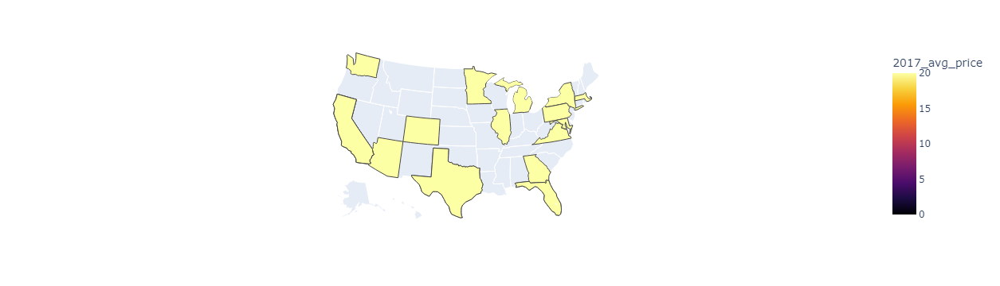

In [124]:
px.choropleth(Top_avg_zil_price, locations = 'StateName', color = '2017_avg_price', color_continuous_scale = 'Inferno',
             locationmode = 'USA-states',scope='usa', range_color = (0,20))

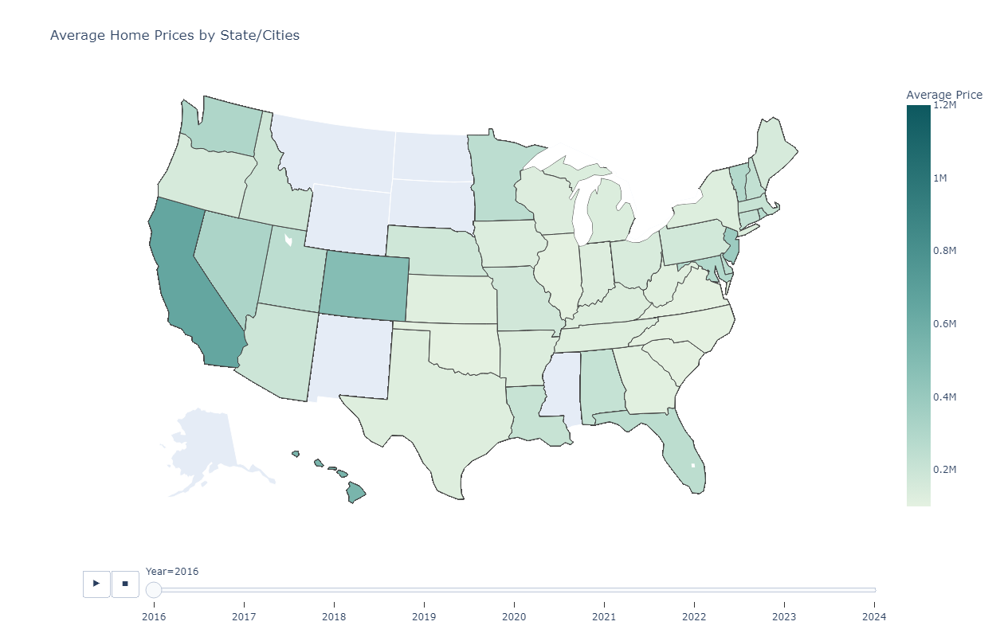

In [127]:
# Create the animated choropleth map
fig = px.choropleth(cities_melt_my, locations='StateName', locationmode='USA-states', color='Value',
                    animation_frame='Year', range_color=[100000, 1200000],
                    hover_name='RegionName', hover_data=['Value'],
                    color_continuous_scale='Mint', title='Average Home Prices by State/Cities')

# Adjust the layout and display the map
fig.update_layout(
    geo=dict(scope='usa'),
    coloraxis_colorbar=dict(title='Average Price')
)
#Resize the choropleth map to be more readable
fig.update_layout(height=800, width=1000)
fig.show()

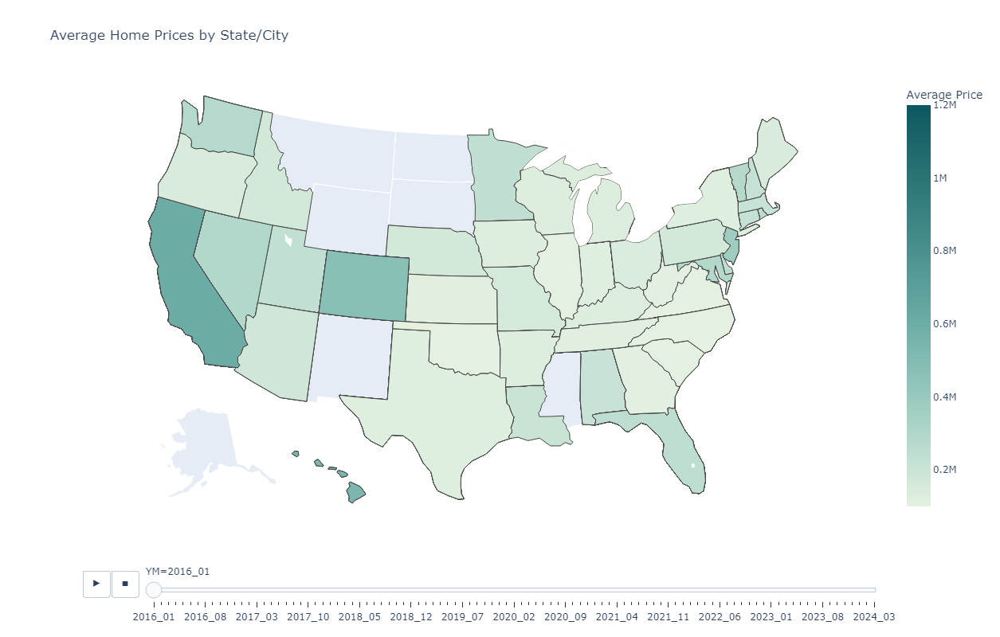

In [126]:
# Create the animated choropleth map
fig = px.choropleth(cities_melt_my, locations='StateName', locationmode='USA-states', color='Value',
                    animation_frame='YM', range_color=[100000, 1200000],
                    hover_name='RegionName', hover_data=['Value'],
                    color_continuous_scale='Mint', title='Average Home Prices by State/City')

# Adjust the layout and display the map
fig.update_layout(
    geo=dict(scope='usa'),
    coloraxis_colorbar=dict(title='Average Price')
)
#Resize the choropleth map to be more readable
fig.update_layout(height=800, width=1000)
fig.show()